In [23]:
# !pip install -U fashion-clip

In [2]:
import sys
import os
#sys.path.append("fashion-clip/")
from fashion_clip.fashion_clip import FashionCLIP
import pandas as pd
import numpy as np
from collections import Counter
from PIL import Image
import numpy as np
from sklearn.metrics import classification_report
from sklearn.model_selection import train_test_split
from sklearn.metrics import *
from sklearn.linear_model import LogisticRegression

/home/cat/.env/tf_env/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
2025-08-04 19:42:02.537076: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-08-04 19:42:02.814819: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-08-04 19:42:04.049591: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [3]:
fclip = FashionCLIP('fashion-clip')

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


In [4]:
category = "Shirts & Blouses"
subcategory = "Button-Up Shirt"

In [5]:
import glob
images = glob.glob("/home/cat/projects/CV-stuff/datasets/multilabel_fashion_dataset/upperwear_not_in_db/"+category+"/"+subcategory+"/*.jpg")


In [6]:
# we create image embeddings and text embeddings
image_embeddings = fclip.encode_images(images, batch_size=32)
# image_embeddings = fclip.encode_images(images, batch_size=4)

# we normalize the embeddings to unit norm (so that we can use dot product instead of cosine similarity to do comparisons)
image_embeddings = image_embeddings/np.linalg.norm(image_embeddings, ord=2, axis=-1, keepdims=True)

3it [00:01,  2.09it/s]                       


In [7]:
fit_labels = [
# "No Fit",
# "Form Fit / Bodycon",
# "Slim Fit",
"Tailored Fit",
"Regular Fit",
# "Relaxed Fit",
# "Loose Fit",
"Oversized Fit",
# "Baggy Fit"
]

length_labels = [
# "Cropped",
# "Waist Length",
"Hip Length",
# "High Thigh",
# "Mid Thigh",
# "Tunic Length",
# "Above Knee",
# "Knee Length",
# "Below Knee",
# "Mid-Calf",
# "Ankle Length",
# "Full Length",
# "Floor Length"
]

sleeves_labels = [
# "No sleeves",
# "Strappy",
# "Sleeveless",
# "Cap Sleeve",
"Short Sleeve",
# "Elbow Sleeve",
# "three-quarter length Sleeve",
"Long Sleeve",
# "Extra Long Sleeve"
]

neck_labels = [
# "No neck",
# "Crew Neck",
# "V-Neck",
# "Scoop Neck",
# "Square Neck",
# "Sweetheart Neck",
# "Boat Neck / Bateau",
# "Turtleneck",
# "Mock Neck",
# "Cowl Neck",
# "Halter Neck",
# "Off-the-Shoulder",
# "One-Shoulder",
# "Strapless / Bandeau",
# "Keyhole Neck",
"Collared",
# "Plunging Neck",
# "Asymmetrical Neck",
]

fastener_labels = [
# "No Buttons",
"Buttons",
# "double-button row",
# "Zipper",
# "Zipper and Buttons",
# "Tie / Wrap",
# "Belt",
# "Laces",
# "buckles",
]

In [8]:
fit_prompt = [f"a photo has a {k}" for k in fit_labels]
fit_embeddings = fclip.encode_text(fit_prompt, batch_size=32)
fit_embeddings = fit_embeddings/np.linalg.norm(fit_embeddings, ord=2, axis=-1, keepdims=True)
predicted_fit_distribution = fit_embeddings.dot(image_embeddings.T)
predicted_fit = [fit_labels[f] for f in np.argmax(predicted_fit_distribution, axis=0)]

Map: 100%|██████████| 3/3 [00:00<00:00, 241.30 examples/s]
1it [00:00, 34.33it/s]


In [9]:
length_prompt = [f"a photo has a {k}" for k in length_labels]
length_embeddings = fclip.encode_text(length_prompt, batch_size=32)
length_embeddings = length_embeddings/np.linalg.norm(length_embeddings, ord=2, axis=-1, keepdims=True)
predicted_length_distribution = length_embeddings.dot(image_embeddings.T)
predicted_length = [length_labels[l] for l in np.argmax(predicted_length_distribution, axis=0)]

Map: 100%|██████████| 1/1 [00:00<00:00, 280.84 examples/s]
1it [00:00, 68.59it/s]


In [10]:
sleeves_prompt = [f"a photo has a {k}" for k in sleeves_labels]
sleeves_embeddings = fclip.encode_text(sleeves_prompt, batch_size=32)
sleeves_embeddings = sleeves_embeddings/np.linalg.norm(sleeves_embeddings, ord=2, axis=-1, keepdims=True)
predicted_sleeves_distribution = sleeves_embeddings.dot(image_embeddings.T)
predicted_sleeves = [sleeves_labels[sl] for sl in np.argmax(predicted_sleeves_distribution, axis=0)]

Map: 100%|██████████| 2/2 [00:00<00:00, 552.50 examples/s]
1it [00:00, 33.94it/s]


In [11]:
neckline_prompt = [f"a photo has a {k}" for k in neck_labels]
neckline_embeddings = fclip.encode_text(neckline_prompt, batch_size=32)
neckline_embeddings = neckline_embeddings/np.linalg.norm(neckline_embeddings, ord=2, axis=-1, keepdims=True)
predicted_neckline_distribution = neckline_embeddings.dot(image_embeddings.T)
predicted_neckline = [neck_labels[n] for n in np.argmax(predicted_neckline_distribution, axis=0)]


Map: 100%|██████████| 1/1 [00:00<00:00, 211.17 examples/s]
1it [00:00, 67.89it/s]


In [12]:
fastener_prompt = [f"a photo has a {k}" for k in fastener_labels]
fastener_embeddings = fclip.encode_text(fastener_prompt, batch_size=32)
fastener_embeddings = fastener_embeddings/np.linalg.norm(fastener_embeddings, ord=2, axis=-1, keepdims=True)
predicted_fastener_distribution = fastener_embeddings.dot(image_embeddings.T)
predicted_fastener = [fastener_labels[fas] for fas in np.argmax(predicted_fastener_distribution, axis=0)]

Map: 100%|██████████| 1/1 [00:00<00:00, 300.62 examples/s]
1it [00:00, 42.53it/s]


In [13]:
df = pd.DataFrame(columns=["category", "subcategory", "img", "fit", "length", "front_opening", "neck", "sleeves", "hood", "fastener", "material", "design", "embeddings"])

0 Regular Fit Long Sleeve


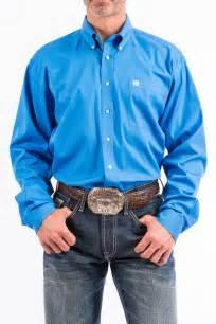

1 Regular Fit Short Sleeve


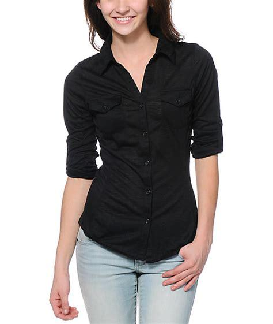

2 Regular Fit Short Sleeve


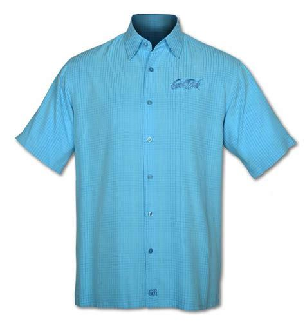

3 Oversized Fit Long Sleeve


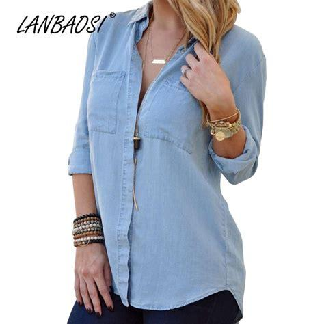

4 Regular Fit Short Sleeve


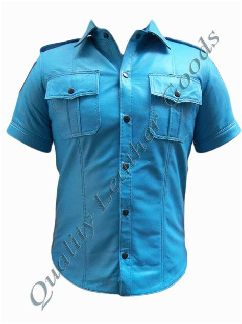

5 Regular Fit Short Sleeve


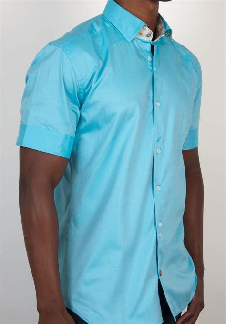

6 Regular Fit Long Sleeve


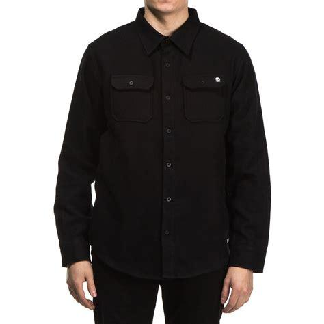

7 Tailored Fit Short Sleeve


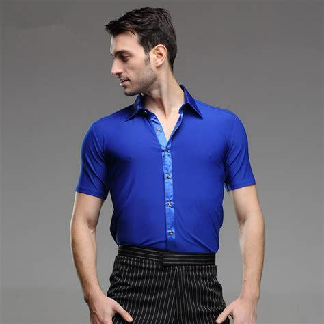

8 Tailored Fit Short Sleeve


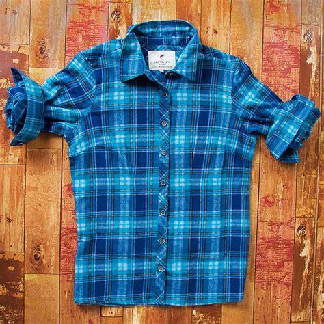

9 Regular Fit Short Sleeve


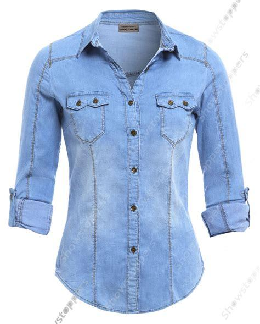

10 Regular Fit Short Sleeve


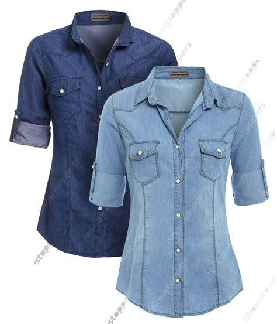

11 Tailored Fit Long Sleeve


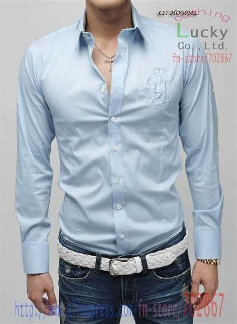

12 Tailored Fit Long Sleeve


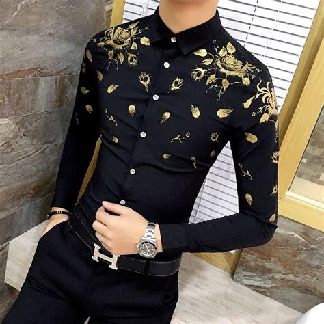

13 Tailored Fit Short Sleeve


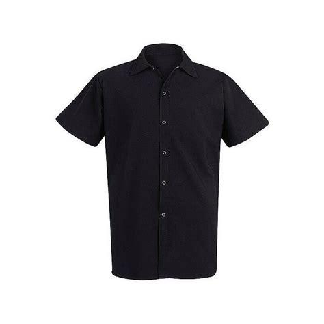

14 Regular Fit Long Sleeve


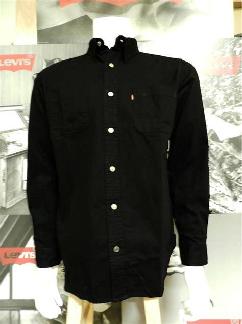

15 Regular Fit Short Sleeve


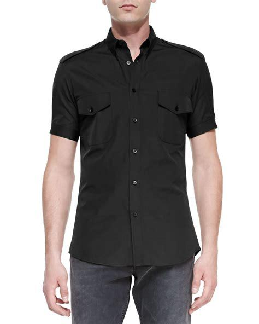

16 Regular Fit Short Sleeve


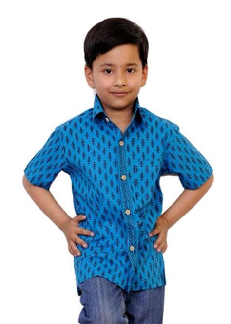

17 Regular Fit Long Sleeve


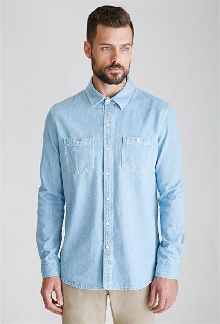

18 Regular Fit Long Sleeve


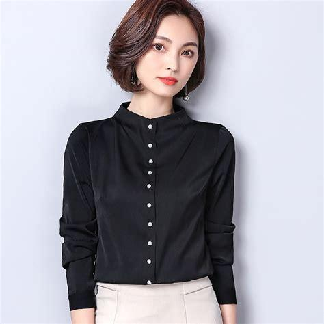

19 Oversized Fit Long Sleeve


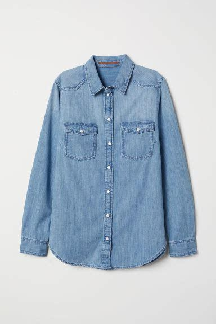

20 Tailored Fit Short Sleeve


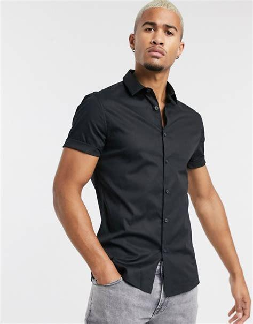

21 Regular Fit Short Sleeve


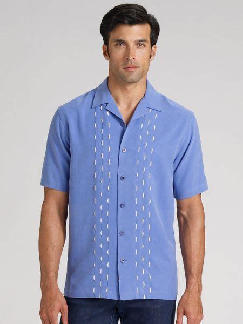

22 Tailored Fit Long Sleeve


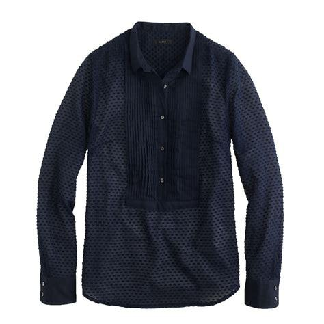

23 Regular Fit Long Sleeve


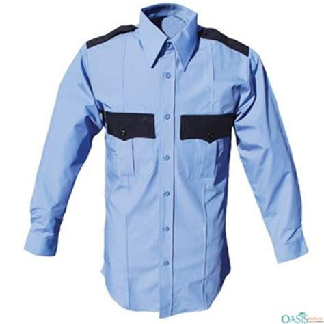

24 Regular Fit Short Sleeve


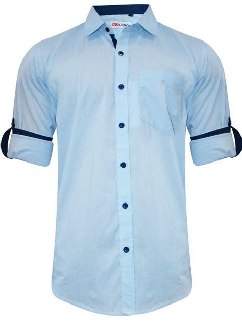

25 Tailored Fit Short Sleeve


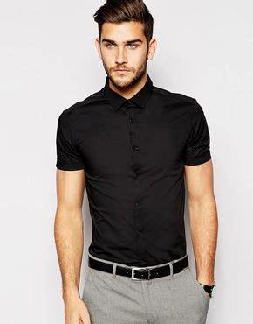

26 Regular Fit Short Sleeve


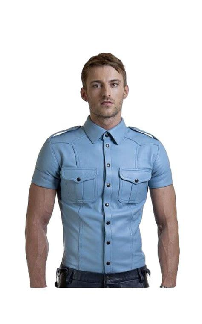

27 Regular Fit Long Sleeve


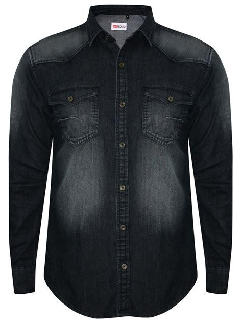

28 Regular Fit Short Sleeve


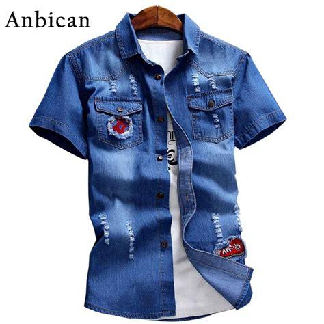

29 Regular Fit Long Sleeve


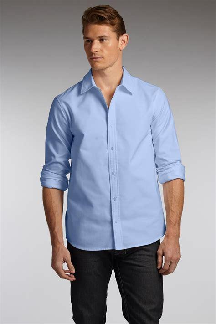

30 Regular Fit Long Sleeve


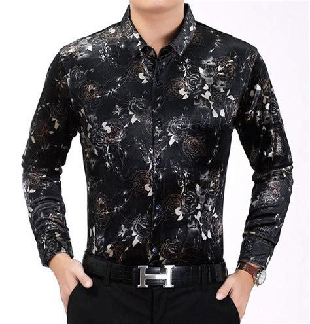

31 Regular Fit Short Sleeve


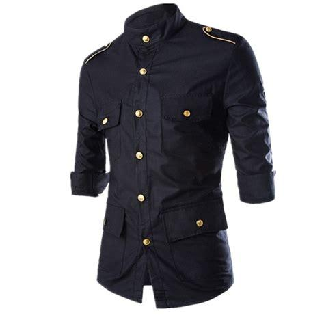

32 Regular Fit Long Sleeve


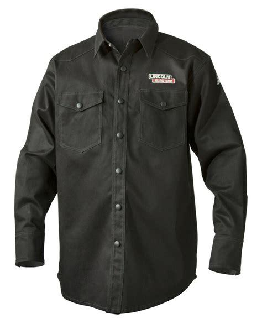

33 Regular Fit Long Sleeve


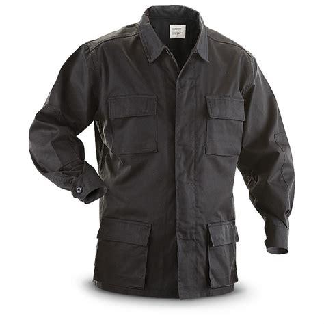

34 Tailored Fit Short Sleeve


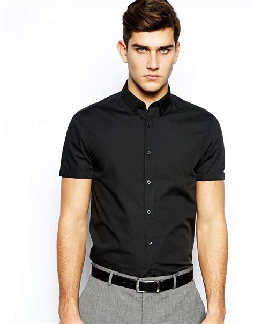

35 Regular Fit Long Sleeve


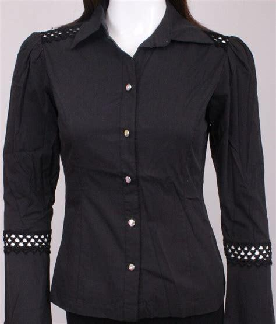

36 Regular Fit Short Sleeve


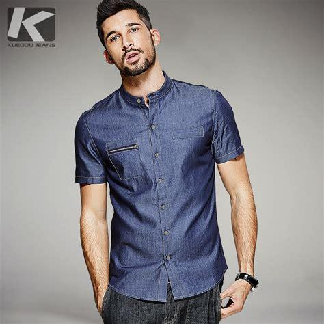

37 Regular Fit Long Sleeve


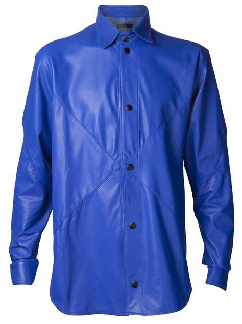

38 Tailored Fit Short Sleeve


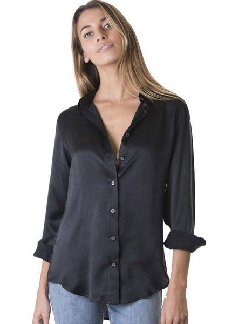

39 Regular Fit Short Sleeve


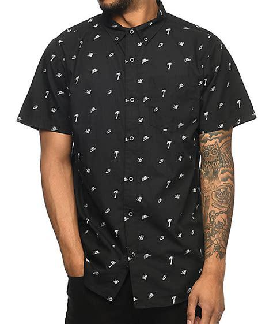

40 Tailored Fit Long Sleeve


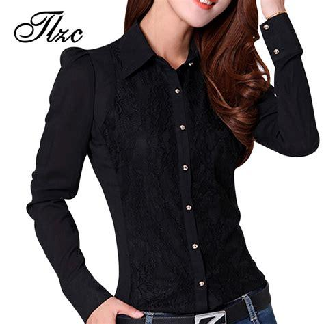

41 Tailored Fit Long Sleeve


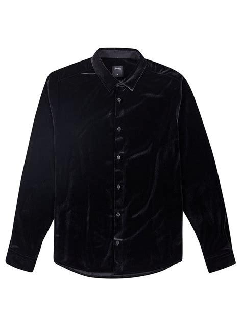

42 Regular Fit Long Sleeve


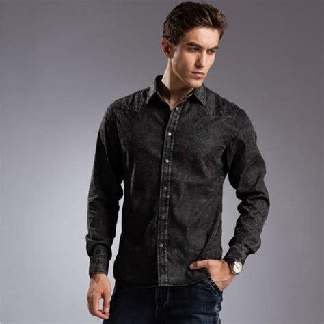

43 Regular Fit Long Sleeve


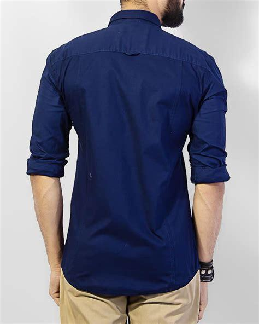

44 Tailored Fit Long Sleeve


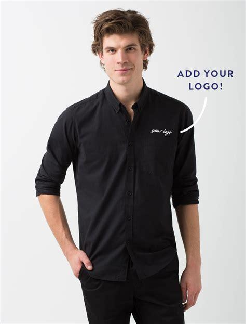

45 Tailored Fit Long Sleeve


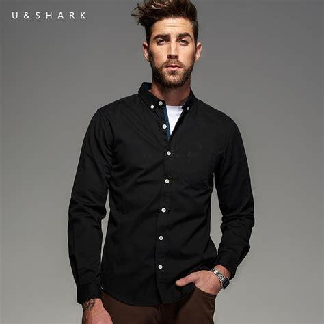

46 Regular Fit Long Sleeve


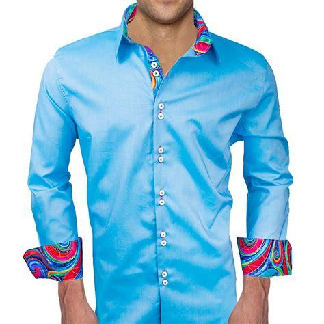

47 Oversized Fit Long Sleeve


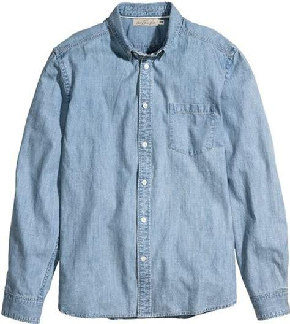

48 Regular Fit Long Sleeve


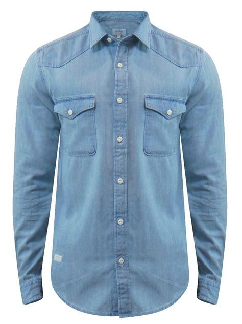

49 Regular Fit Long Sleeve


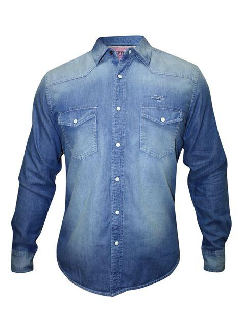

50 Tailored Fit Long Sleeve


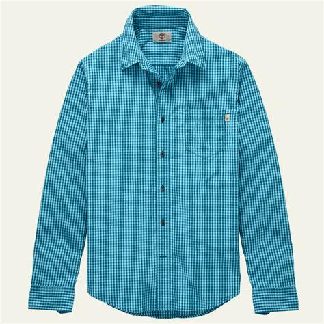

51 Tailored Fit Long Sleeve


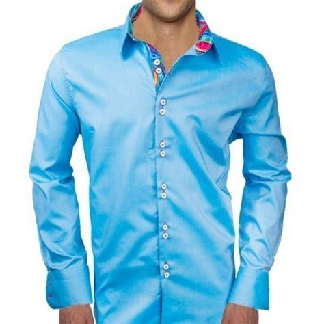

52 Regular Fit Short Sleeve


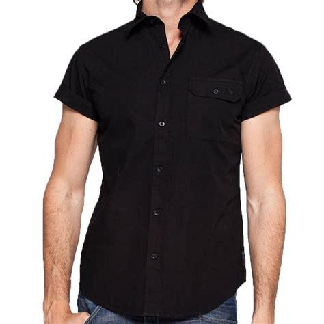

53 Regular Fit Short Sleeve


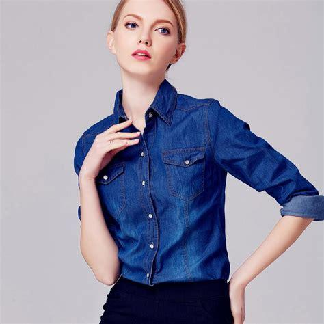

54 Tailored Fit Long Sleeve


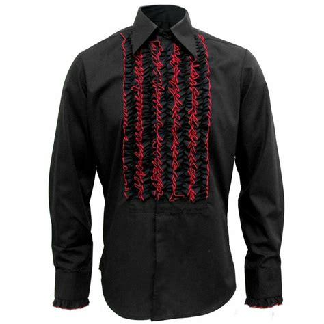

55 Tailored Fit Long Sleeve


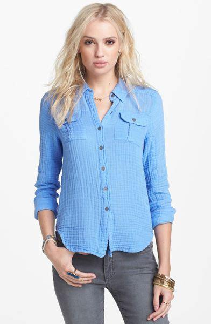

56 Regular Fit Long Sleeve


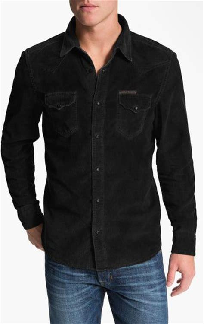

57 Regular Fit Long Sleeve


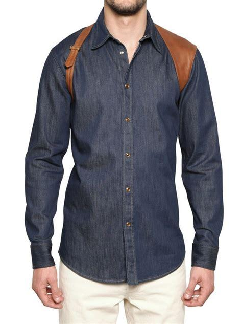

58 Regular Fit Long Sleeve


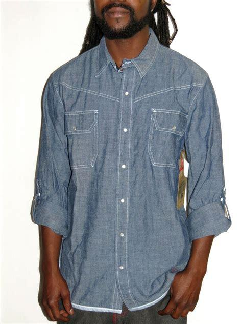

59 Regular Fit Long Sleeve


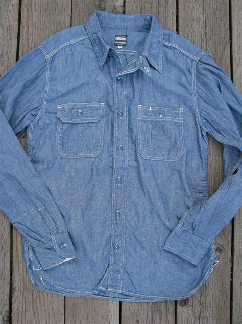

60 Regular Fit Long Sleeve


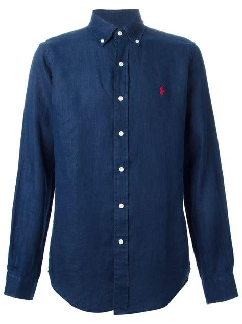

61 Regular Fit Short Sleeve


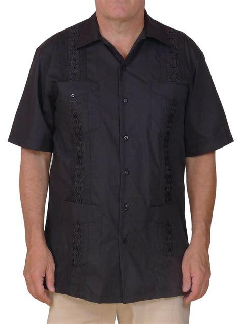

62 Regular Fit Long Sleeve


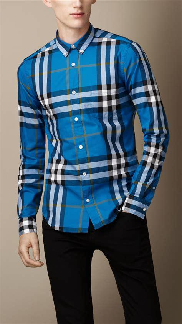

63 Regular Fit Short Sleeve


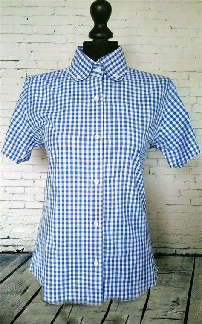

64 Regular Fit Long Sleeve


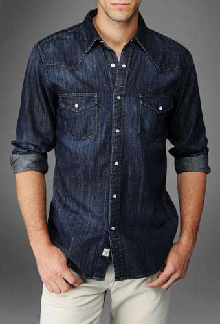

65 Regular Fit Long Sleeve


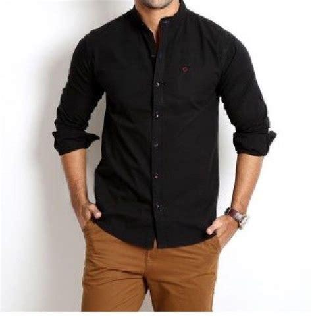

66 Regular Fit Short Sleeve


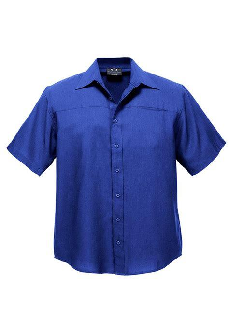

67 Oversized Fit Long Sleeve


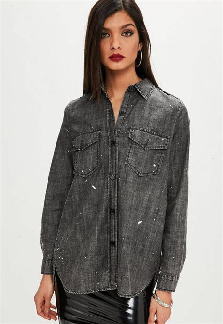

68 Regular Fit Short Sleeve


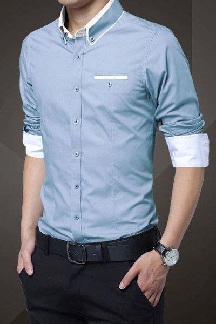

69 Tailored Fit Long Sleeve


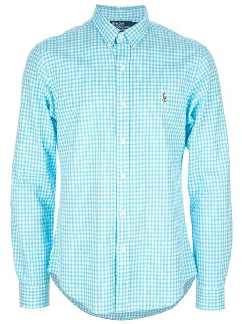

70 Regular Fit Short Sleeve


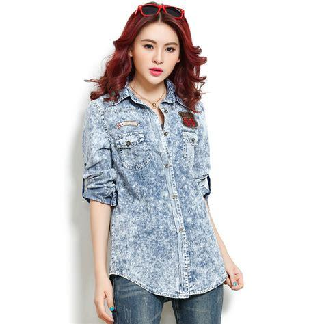

71 Regular Fit Long Sleeve


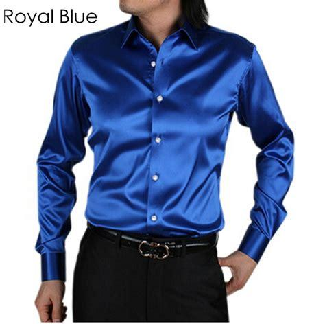

72 Regular Fit Long Sleeve


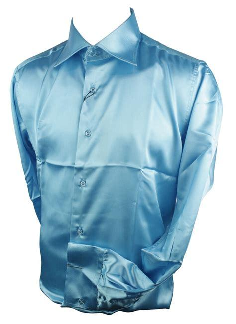

73 Regular Fit Long Sleeve


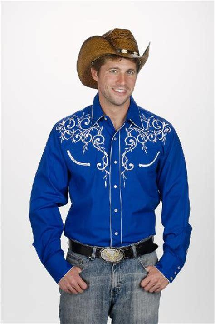

74 Regular Fit Short Sleeve


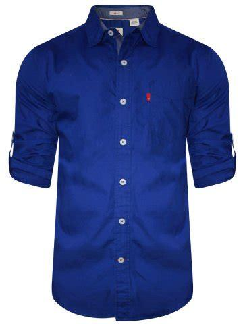

75 Regular Fit Long Sleeve


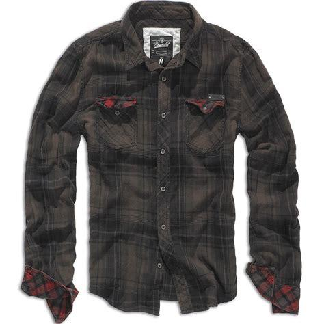

76 Regular Fit Long Sleeve


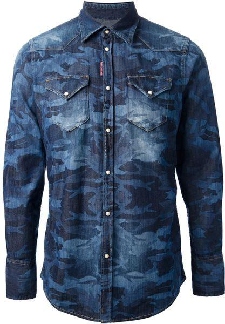

77 Tailored Fit Long Sleeve


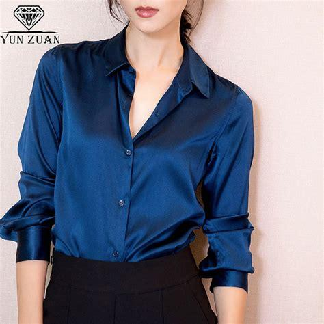

78 Regular Fit Short Sleeve


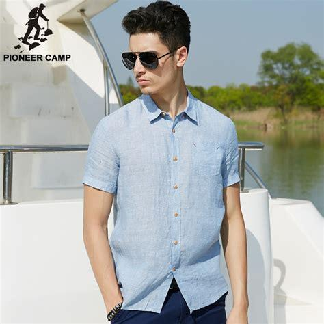

79 Regular Fit Short Sleeve


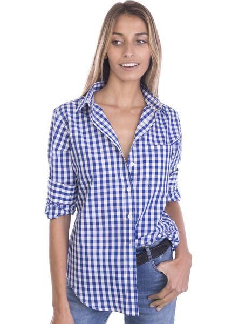

80 Regular Fit Short Sleeve


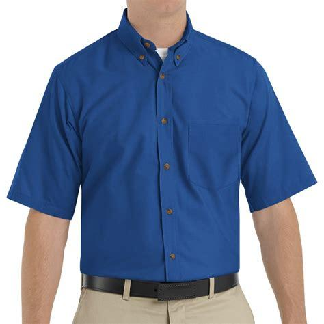

81 Regular Fit Long Sleeve


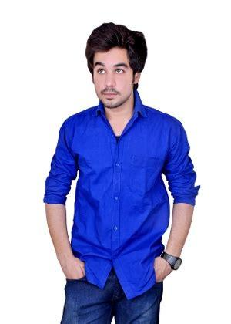

82 Regular Fit Long Sleeve


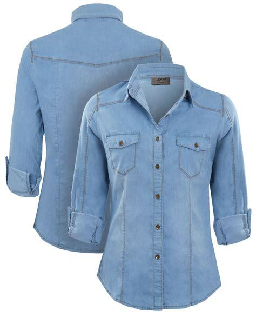

83 Oversized Fit Long Sleeve


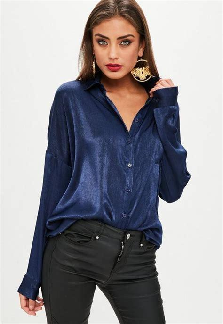

84 Tailored Fit Long Sleeve


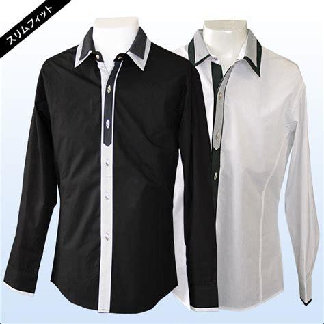

85 Tailored Fit Long Sleeve


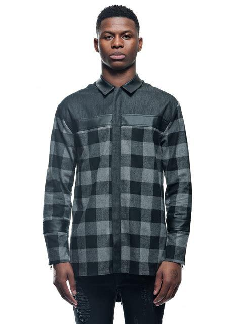

86 Regular Fit Long Sleeve


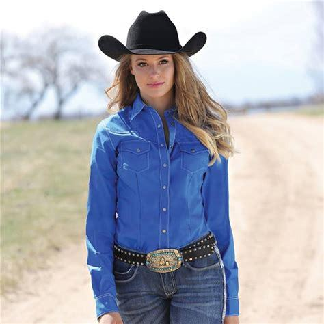

87 Regular Fit Short Sleeve


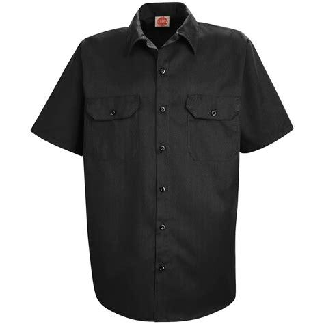

In [14]:
from IPython.display import display

fixed_height = 324
for ind, (img, fit, length, sleeves, neck, fastener) in enumerate(zip(images, predicted_fit, predicted_length, predicted_sleeves, predicted_neckline, predicted_fastener)):
    image = Image.open(img)
    height_percent = (fixed_height / float(image.size[1]))
    width_size = int((float(image.size[0]) * float(height_percent)))
    image = image.resize((width_size, fixed_height), Image.NEAREST)
    # print(ind, fit, length, sleeves, neck, fastener)
    print(ind, fit, sleeves)
    df.loc[len(df)] = [category, subcategory, img, fit, length, "true", neck, sleeves, "false", "Buttons", "light woven", "", image_embeddings[ind].tolist()]
    display(image)
    


In [15]:
df

,category,subcategory,img,fit,length,front_opening,neck,sleeves,hood,fastener,material,design,embeddings
0,Shirts & Blouses,Button-Up Shirt,/home/cat/projects/CV-stuff/datasets/multilabe...,Regular Fit,Hip Length,true,Collared,Long Sleeve,false,Buttons,light woven,,"[-0.0166128259152174, -0.09074155986309052, -0..."
1,Shirts & Blouses,Button-Up Shirt,/home/cat/projects/CV-stuff/datasets/multilabe...,Regular Fit,Hip Length,true,Collared,Short Sleeve,false,Buttons,light woven,,"[-0.016434572637081146, 0.0359741672873497, 0...."
2,Shirts & Blouses,Button-Up Shirt,/home/cat/projects/CV-stuff/datasets/multilabe...,Regular Fit,Hip Length,true,Collared,Short Sleeve,false,Buttons,light woven,,"[0.002289288677275181, -0.12464886903762817, -..."
3,Shirts & Blouses,Button-Up Shirt,/home/cat/projects/CV-stuff/datasets/multilabe...,Oversized Fit,Hip Length,true,Collared,Long Sleeve,false,Buttons,light woven,,"[-0.015823960304260254, 0.09266283363103867, -..."
4,Shirts & Blouses,Button-Up Shirt,/home/cat/projects/CV-stuff/datasets/multilabe...,Regular Fit,Hip Length,true,Collared,Short Sleeve,false,Buttons,light woven,,"[0.002200720366090536, -0.07092119008302689, -..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...
83,Shirts & Blouses,Button-Up Shirt,/home/cat/projects/CV-stuff/datasets/multilabe...,Oversized Fit,Hip Length,true,Collared,Long Sleeve,false,Buttons,light woven,,"[-0.013547196984291077, 0.11510706692934036, -..."
84,Shirts & Blouses,Button-Up Shirt,/home/cat/projects/CV-stuff/datasets/multilabe...,Tailored Fit,Hip Length,true,Collared,Long Sleeve,false,Buttons,light woven,,"[0.021816672757267952, -0.002614757511764765, ..."
85,Shirts & Blouses,Button-Up Shirt,/home/cat/projects/CV-stuff/datasets/multilabe...,Tailored Fit,Hip Length,true,Collared,Long Sleeve,false,Buttons,light woven,,"[-0.002531290054321289, -0.02631600946187973, ..."
86,Shirts & Blouses,Button-Up Shirt,/home/cat/projects/CV-stuff/datasets/multilabe...,Regular Fit,Hip Length,true,Collared,Long Sleeve,false,Buttons,light woven,,"[0.027263984084129333, -0.0027242624200880527,..."


In [595]:
# Filter DataFrame for crew neck
# selected_df = df[(df["neck"] == "Crew Neck") & (df.index!=3) & (df.index!=7)& (df.index!=16) & (df.index!=25) & (df.index!=55)& (df.index!=59) & (df.index!=62) ]
# selected_df = df[(df["sleeves"] == "Short Sleeve") & (df.index!=6) & (df.index!=22)& (df.index!=23) & (df.index!=28)& (df.index!=63) & (df.index!=84)& (df.index!=101)
                #  & (df.index!=106) & (df.index!=122)& (df.index!=138) & (df.index!=141)& (df.index!=155) ]
# selected_df = df[df["fit"] == "Oversized Fit"]
# selected_df = df[(df["fastener"] == "No Buttons") & (df.index!=6) & (df.index!=8)& (df.index!=9) & (df.index!=10)& (df.index!=11) & (df.index!=12)& (df.index!=14) 
#                  & (df.index!=18)& (df.index!=23) & (df.index!=27)& (df.index!=39) & (df.index!=43)& (df.index!=63) & (df.index!=65)& (df.index!=71) & (df.index!=75)]
# selected_df = df[(df["sleeves"] == "Long Sleeve")]
# selected_df = df
# Optional: limit how many images to show

# fixed_height = 324
# for idx, row in selected_df.iterrows():
#     img_path = row["img"]  # Assumes this column has full image paths

#     try:
#         image = Image.open(img_path)
        
#         height_percent = (fixed_height / float(image.size[1]))
#         width_size = int((float(image.size[0]) * float(height_percent)))
#         image = image.resize((width_size, fixed_height), Image.NEAREST)
#         print(idx, row["fit"], row["length"], row["sleeves"], row["neck"], row["fastener"])
#         display(image)
#     except Exception as e:
#         print(f"Error opening {img_path}: {e}")


In [ ]:
# df.loc[[11, 35], "sleeves"] = "Long Sleeve"
# df.loc[(df["sleeves"] == "Buttons"), "sleeves"] = "Long Sleeve"
# df.loc[(df["sleeves"] == "Short Sleeve") & (df.index!=6) & (df.index!=22)& (df.index!=23) & (df.index!=28)& (df.index!=63) & (df.index!=84)& (df.index!=101)
#                  & (df.index!=106) & (df.index!=122)& (df.index!=138) & (df.index!=141)& (df.index!=155), "sleeves"] = "Long Sleeve"

In [ ]:
# df.loc[(df["fastener"] == "Buttons"), "fastener"] = "No Buttons"

In [ ]:
# df.loc[(df["neck"] == "Crew Neck") & (df.index!=3) & (df.index!=7)& (df.index!=16) & (df.index!=25) & (df.index!=55)& (df.index!=59) & (df.index!=62), "neck"] = "V-Neck"
# df.loc[df["subcategory"] == "Cropped Blazer", "length"] = "Waist Length"
# df.loc[df["neck"] == "Crew Neck", "neck"] = "V-Neck"
# df.loc[(df.index==60), "neck"] = "Crew Neck"

indeces = [22]
# df.loc[df.index.isin(indeces), "neck"] = "Scoop Neck"
# df.loc[df.index.isin(indeces), "sleeves"] = "Short Sleeve"
# df.loc[df.index.isin(indeces), "length"] = "Cropped"
# df.loc[df.index.isin(indeces), "fit"] = "Oversized Fit"
# df.loc[df.index.isin(indeces), "material"] = "light woven"
# df.loc[df.index.isin(indeces), "subcategory"] = "Tunic Shirte"
# df.loc[df.index.isin(indeces), "design"] = "Laces"
# df.loc[df.index.isin(indeces), "fastener"] = "Buttons"
# df.loc[df.index.isin(indeces), "front_opening"] = "false"


In [26]:
df

,category,subcategory,img,fit,length,front_opening,neck,sleeves,hood,fastener,material,design,embeddings
0,Shirts & Blouses,Button-Up Shirt,/home/cat/projects/CV-stuff/datasets/multilabe...,Regular Fit,Hip Length,true,Collared,Long Sleeve,false,Buttons,light woven,,"[-0.0166128259152174, -0.09074155986309052, -0..."
1,Shirts & Blouses,Button-Up Shirt,/home/cat/projects/CV-stuff/datasets/multilabe...,Tailored Fit,Hip Length,true,Collared,Short Sleeve,false,Buttons,light woven,,"[-0.016434572637081146, 0.0359741672873497, 0...."
2,Shirts & Blouses,Button-Up Shirt,/home/cat/projects/CV-stuff/datasets/multilabe...,Regular Fit,Hip Length,true,Collared,Short Sleeve,false,Buttons,light woven,,"[0.002289288677275181, -0.12464886903762817, -..."
3,Shirts & Blouses,Button-Up Shirt,/home/cat/projects/CV-stuff/datasets/multilabe...,Oversized Fit,Hip Length,true,Collared,Long Sleeve,false,Buttons,light woven,,"[-0.015823960304260254, 0.09266283363103867, -..."
4,Shirts & Blouses,Button-Up Shirt,/home/cat/projects/CV-stuff/datasets/multilabe...,Regular Fit,Hip Length,true,Collared,Short Sleeve,false,Buttons,light woven,,"[0.002200720366090536, -0.07092119008302689, -..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...
83,Shirts & Blouses,Button-Up Shirt,/home/cat/projects/CV-stuff/datasets/multilabe...,Oversized Fit,Hip Length,true,Collared,Long Sleeve,false,Buttons,light woven,,"[-0.013547196984291077, 0.11510706692934036, -..."
84,Shirts & Blouses,Button-Up Shirt,/home/cat/projects/CV-stuff/datasets/multilabe...,Tailored Fit,Hip Length,true,Collared,Long Sleeve,false,Buttons,light woven,,"[0.021816672757267952, -0.002614757511764765, ..."
85,Shirts & Blouses,Button-Up Shirt,/home/cat/projects/CV-stuff/datasets/multilabe...,Tailored Fit,Hip Length,true,Collared,Long Sleeve,false,Buttons,light woven,,"[-0.002531290054321289, -0.02631600946187973, ..."
86,Shirts & Blouses,Button-Up Shirt,/home/cat/projects/CV-stuff/datasets/multilabe...,Regular Fit,Hip Length,true,Collared,Long Sleeve,false,Buttons,light woven,,"[0.027263984084129333, -0.0027242624200880527,..."


In [ ]:
# df = df.iloc[78:].reset_index(drop=True)


In [386]:
# for idx, row in df.iterrows():
#     img_path = row["img"]  # Assumes this column has full image paths

#     try:
#         image = Image.open(img_path)
        
#         height_percent = (fixed_height / float(image.size[1]))
#         width_size = int((float(image.size[0]) * float(height_percent)))
#         image = image.resize((width_size, fixed_height), Image.NEAREST)
#         print(idx, row["fit"], row["length"], row["sleeves"], row["neck"], row["fastener"])
#         display(image)
#     except Exception as e:
#         print(f"Error opening {img_path}: {e}")

In [27]:
saved_df = pd.read_csv("fashion-clip.csv")
combined_df = pd.concat([saved_df, df])
combined_df["img"] = combined_df["img"].apply(os.path.basename)
combined_df.to_csv("fashion-clip.csv", index=False)